In [1]:
import sys
sys.path.append('C:\\projects\\UTNCE\\src\\utnce')

In [2]:
from simplify import *
from prepare import *
from routing import *
from percolation_plot import *
from generate import *
from transfer import *

In [3]:
# osm_path = "C:\\projects\\UTNCE\\data\\rotterdam.metro.pbf"
osm_path = "C:\\projects\\UTNCE\\data\\Amsterdam.large.pbf"

In [4]:
s_e_coordinates = {
    's_coordinates_x': 4.8322048, 
    's_coordinates_y': 52.3872658, 
    'e_coordinates_x': 4.8931115, 
    'e_coordinates_y': 52.3802376
}

# Bus -- This test only has bus route

In [5]:
bus_stations, bus_edges, bus_nodes, bus_routes = prepare_bus(osm_path)

topology: 100%|████████████████████████████████████████████████████████████████| 71634/71634 [00:08<00:00, 8172.55it/s]


In [6]:
bus_routes = bus_routes.loc[bus_routes.network == 'Stadsvervoer Amsterdam']
bus_routes = bus_routes.loc[bus_routes.service != 'night']

In [7]:
bus_routes, check_name = check_bus_routes(bus_stations, bus_routes)

In [8]:
replacement_dict = {
    'Amsterdam, ': '',
    'Amsterdam': '',
    'Weesp Station': 'Station',
    'Osdorp De Aker': 'Matterhorn',
    'Schiphol, Airport/Plaza': 'Schiphol, Airport',
    'De Boelelaan': 'De Boelelaan/De Klencke'
}
replacement_dict1 = {
    'Amsterdam, ': '',
    'Amsterdam': '',
}

bus_stations['name'] = bus_stations['name'].replace(replacement_dict1, regex=True).str.strip()

bus_stations, bus_routes, check_name = recheck_bus_routes(replacement_dict, bus_stations, bus_routes)

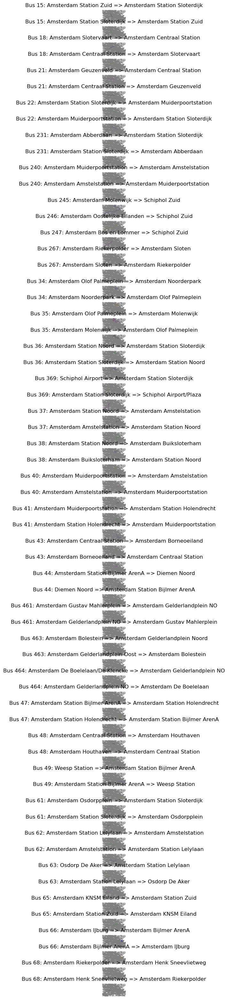

In [9]:
bus_order_route_dict, bus_shortest_path_pairs, bus_shortest_path_edges, bus_edges_dict = bus(bus_stations, bus_edges, bus_nodes, bus_routes, city='Amsterda,')

In [10]:
bus_shortest_path_edges

{'Bus 15: Amsterdam Station Zuid => Amsterdam Station Sloterdijk':         osm_id                                           geometry  \
 0      7379505  LINESTRING (4.8437968 52.3782783, 4.8437477 52...   
 1      7379515  LINESTRING (4.8437069 52.3780337, 4.8436834 52...   
 2      7379536  LINESTRING (4.8444398 52.3818536, 4.8444628 52...   
 3      7379543  LINESTRING (4.8444657 52.3807531, 4.8443583 52...   
 4      8662467  LINESTRING (4.840192 52.3859065, 4.8401934 52....   
 ..         ...                                                ...   
 123   26982262  LINESTRING (4.868856 52.3407019, 4.8687748 52....   
 124   26982266  LINESTRING (4.8686811 52.3406912, 4.8685547 52...   
 125   26982270  LINESTRING (4.8685333 52.3408305, 4.8685173 52...   
 126   26982271  LINESTRING (4.8685547 52.3406798, 4.8685333 52...   
 127  277170888  LINESTRING (4.8683298 52.3425058, 4.8682898 52...   
 
             highway     id  from_id  to_id    distance      time  weights  \
 0     motorwa

In [28]:
bus_edges_dict

,osm_id,geometry,highway,id,from_id,to_id,distance,time,weights,to_from,from_to,count_weight
0,4436684,"LINESTRING (4.9683596 52.3558775, 4.9683345 52...",steps,0,0,1,4.049164,0.000324,4,"(0, 1)","(1, 0)",1.0
1,4495957,"LINESTRING (4.8601784 52.357593, 4.8601399 52....",steps,1,2,3,7.754968,0.000620,7,"(2, 3)","(3, 2)",1.0
2,4496429,"LINESTRING (4.8743983 52.358788, 4.8744747 52....",service,2,4,5,68.807947,0.005505,68,"(4, 5)","(5, 4)",1.0
3,4727308,"LINESTRING (4.9563878 52.377293, 4.9564629 52....",path,3,6,65237,46.383298,0.003711,46,"(6, 65237)","(65237, 6)",1.0
4,4727308,"LINESTRING (4.9564856 52.376881, 4.9564944 52....",path,4,65237,7,2.090290,0.000167,2,"(65237, 7)","(7, 65237)",1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
71623,1185077512,"LINESTRING (4.795149 52.3318873, 4.7953163 52....",service,71623,65586,65587,29.884042,0.002391,29,"(65586, 65587)","(65587, 65586)",1.0
71624,1185077519,"LINESTRING (4.7974835 52.3325307, 4.7972201 52...",service,71624,65588,65589,19.267219,0.001541,19,"(65588, 65589)","(65589, 65588)",1.0
71625,1185077520,"LINESTRING (4.7967795 52.3323057, 4.7972519 52...",service,71625,65590,65591,34.723141,0.002778,34,"(65590, 65591)","(65591, 65590)",1.0
71626,1185077524,"LINESTRING (4.7997017 52.3324389, 4.7997688 52...",path,71626,65592,65593,65.462451,0.005237,65,"(65592, 65593)","(65593, 65592)",1.0


In [11]:
bus_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(bus_order_route_dict, bus_routes)

In [12]:
aggregation_functions = {
    'name': 'first',
    'geometry': 'first',
    'geo_x': 'first',
    'geo_y': 'first',
    'route_name_list': lambda x: ', '.join(x),
    'ref': (lambda x: ', '.join(x)),
    'route': 'first'
}

In [13]:
bus_new_nodes = add_columns_to_nodes(bus_order_route_dict, aggregation_functions, bus_nodes)

In [14]:
bus_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(bus_shortest_path_edges, bus_routes)

In [36]:
aggregation_functions = {
    'geometry': 'first',
    # 'count_weight': 'first',
    'route_name_list': lambda x: ', '.join(x),
    'ref': lambda x: ', '.join(x),
    'route': 'first'
}

In [37]:
bus_new_edges = add_columns_to_edges(bus_shortest_path_edges, aggregation_functions,bus_edges_dict)

In [38]:
bus_path_s_e, bus_length_s_e, bus_short_path_edges_s_e, bus_start_end_points_coordinates_pairs, bus_start_end_nearest_id_pairs = transfer_shortest_path(s_e_coordinates, bus_new_edges, bus_new_nodes)

In [39]:
bus_short_path_edges_s_e

,osm_id,geometry,highway,id_x,from_id,to_id,distance,time,weights,to_from,from_to,count_weight,id_y,route_name_list,ref,route
9258,7376103,"LINESTRING (4.893761 52.3807639, 4.8932694 52....",service,9258,8258,8259,59.298925,0.004744,59,"(8258, 8259)","(8259, 8258)",1.0,NaN,NaN,NaN,NaN
9263,7376117,"LINESTRING (4.8892238 52.3825646, 4.8897432 52...",secondary,9263,8268,8269,98.600740,0.007888,98,"(8268, 8269)","(8269, 8268)",1.0,NaN,NaN,NaN,NaN
9264,7376118,"LINESTRING (4.8903745 52.3820268, 4.8911749 52...",secondary,9264,8269,8270,116.991509,0.009359,116,"(8269, 8270)","(8270, 8269)",1.0,NaN,NaN,NaN,NaN
10242,7378643,"LINESTRING (4.8805985 52.3851938, 4.8809185 52...",secondary,10242,9044,9045,54.982774,0.004399,54,"(9044, 9045)","(9045, 9044)",1.0,NaN,NaN,NaN,NaN
10247,7378650,"LINESTRING (4.8822131 52.384876, 4.8822986 52....",secondary,10247,9051,9052,74.233145,0.005939,74,"(9051, 9052)","(9052, 9051)",1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53994,817918967,"LINESTRING (4.8394342 52.3859321, 4.8396864 52...",tertiary,53994,28863,13713,51.763325,0.004141,51,"(28863, 13713)","(13713, 28863)",1.0,53994.0,Bus 15: Amsterdam Station Zuid => Amsterdam St...,"15, 15",bus
54002,817918976,"LINESTRING (4.8404042 52.3848988, 4.8402948 52...",primary,54002,15719,9360,7.447296,0.000596,7,"(15719, 9360)","(9360, 15719)",1.0,NaN,NaN,NaN,NaN
61827,961388895,"LINESTRING (4.8554107 52.3850761, 4.8555836 52...",secondary,61827,9148,68372,43.734686,0.003499,43,"(9148, 68372)","(68372, 9148)",1.0,61827.0,Bus 21: Amsterdam Geuzenveld => Amsterdam Cent...,"21, 21",bus
61828,961388895,"LINESTRING (4.8560523 52.3850963, 4.856794 52....",secondary,61828,68372,9149,50.568927,0.004046,50,"(68372, 9149)","(9149, 68372)",1.0,61828.0,Bus 21: Amsterdam Geuzenveld => Amsterdam Cent...,"21, 21",bus


In [40]:
distance_on_bus = bus_short_path_edges_s_e['distance'].sum()
distance_on_bus

4876.079047278121

In [41]:
bus_distance_s_s_tuple, bus_distance_e_e_tuple = walking_linear_distance(bus_start_end_points_coordinates_pairs, bus_start_end_nearest_id_pairs, bus_new_nodes)

In [42]:
bus_distance_s_s_tuple

24.29233030509612

In [43]:
bus_distance_e_e_tuple

19.91255537194146

In [44]:
choosebus_using_time_tuple = transfer_using_time(bus_short_path_edges_s_e, bus_distance_s_s_tuple, bus_distance_e_e_tuple)

In [45]:
choosebus_using_time_tuple

(0.3989273009176572, 24, 0.3900863237822497, 0.008840977135407515)

<Axes: >

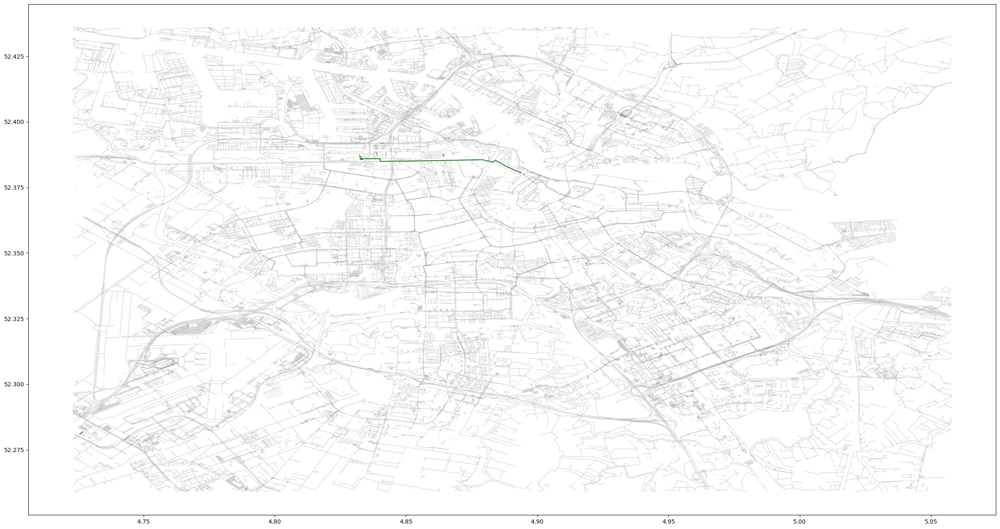

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))

gpd.GeoDataFrame(bus_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)
gpd.GeoDataFrame(bus_short_path_edges_s_e.copy()).plot(ax=ax, zorder=1, color='green')

<Axes: >

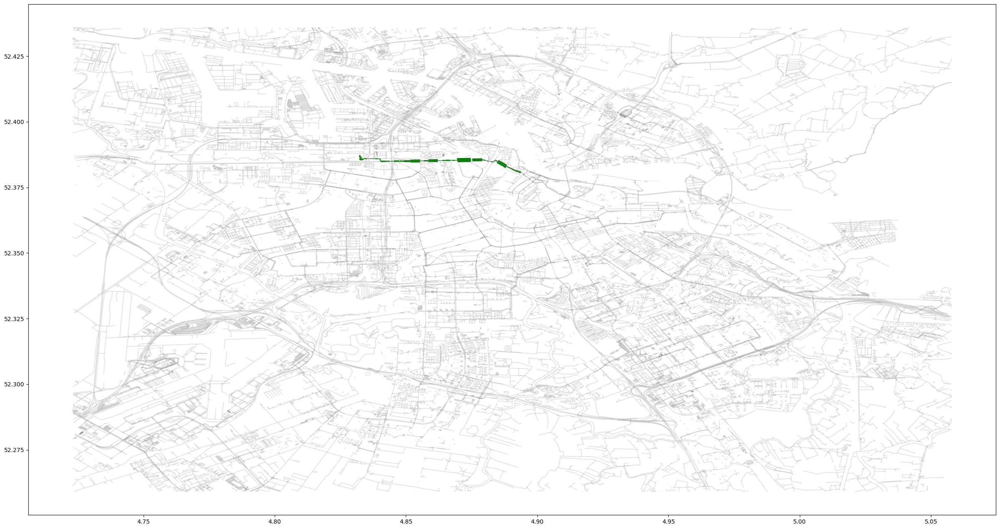

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))

gpd.GeoDataFrame(bus_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)
gpd.GeoDataFrame(bus_short_path_edges_s_e.copy()).plot(ax=ax, zorder=1, linewidth=(bus_short_path_edges_s_e.weights/50), color='green')

<Axes: >

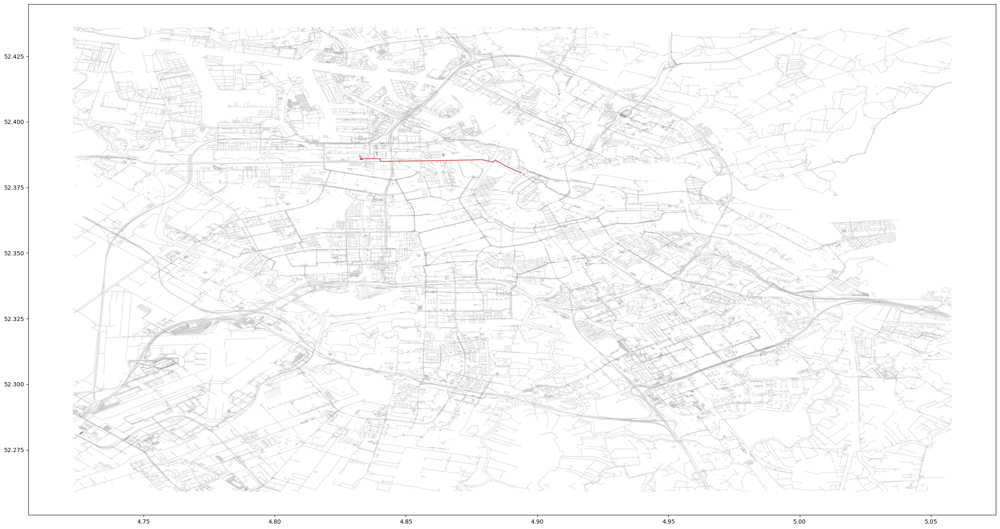

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))

gpd.GeoDataFrame(bus_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)
gpd.GeoDataFrame(bus_short_path_edges_s_e.copy()).plot(ax=ax, zorder=1, linewidth=(bus_short_path_edges_s_e.count_weight), color='red')

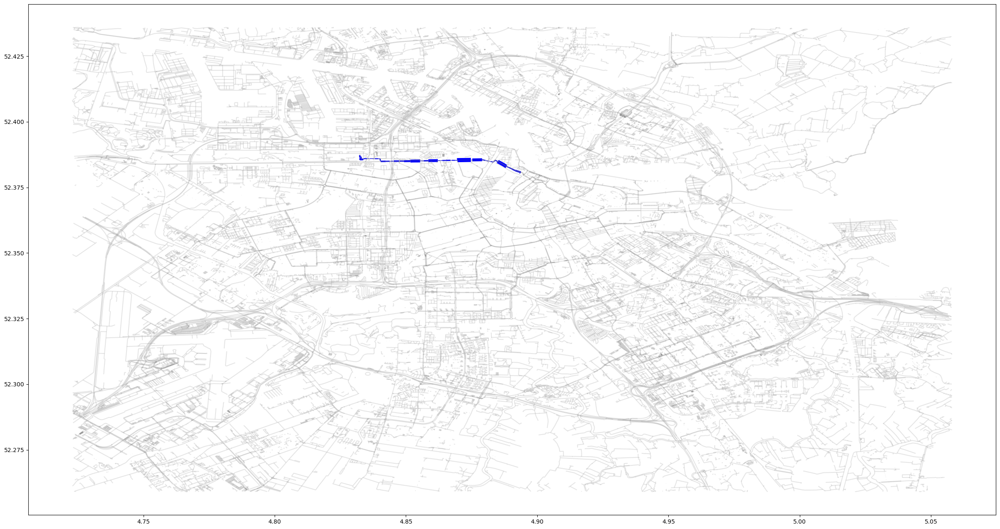

In [26]:
plot_chosen_single_transport(bus_new_edges,bus_short_path_edges_s_e)

In [27]:
# find the reason
# bus_short_path_edges_s_e0 = bus_short_path_edges_s_e.iloc[[0]]
# fig, ax = plt.subplots(1, 1, figsize=(30, 20))

# gpd.GeoDataFrame(bus_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)
# gpd.GeoDataFrame(bus_short_path_edges_s_e0).plot(ax=ax, zorder=1, linewidth=(bus_short_path_edges_s_e0.weights) * 1, color='blue')

# Subway

In [5]:
osm_path = "C:\\projects\\UTNCE\\data\\rotterdam.bus.largest.pbf"

In [6]:
sub_stations, edges, nodes, sub_routes, check_name = prepare_metro(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 1579/1579 [00:00<00:00, 8450.30it/s]


In [7]:
replacement_dict = {
     'Amsterdam Centraal': 'Centraal Station',
}


sub_routes, check_name = recheck_metro_routes(replacement_dict, sub_stations, sub_routes)

In [8]:
sub_routes

,osm_id,route,to,name,ref,network,service,geometry
0,2785672,subway,Vlaardingen West,Metro A: Binnenhof => Vlaardingen West,A,Rail Rotterdam,None,"MULTILINESTRING ((4.53506 51.96028, 4.53508 51..."
1,2785673,subway,Binnenhof,Metro A: Vlaardingen West => Binnenhof,A,Rail Rotterdam,None,"MULTILINESTRING ((4.31574 51.90364, 4.31591 51..."
2,11174054,subway,Schiedam Centrum,Metro A: Binnenhof => Schiedam Centrum,A,Rail Rotterdam,None,"MULTILINESTRING ((4.53506 51.96028, 4.53508 51..."
3,11174055,subway,Binnenhof,Metro A: Schiedam Centrum => Binnenhof,A,Rail Rotterdam,None,"MULTILINESTRING ((4.53315 51.92146, 4.53316 51..."
4,11174056,subway,Binnenhof,Metro A: Kralingse Zoom => Binnenhof,A,Rail Rotterdam,None,"MULTILINESTRING ((4.53315 51.92146, 4.53316 51..."
5,11174057,subway,Kralingse Zoom,Metro A: Binnenhof => Kralingse Zoom,A,Rail Rotterdam,None,"MULTILINESTRING ((4.53506 51.96028, 4.53508 51..."
6,2785674,subway,Hoek van Holland Strand,Metro B: Nesselande => Hoek van Holland Strand,B,Rail Rotterdam,None,"MULTILINESTRING ((4.58655 51.98043, 4.58658 51..."
7,2785675,subway,Nesselande,Metro B: Hoek van Holland Strand => Nesselande,B,Rail Rotterdam,None,"MULTILINESTRING ((4.10702 51.98639, 4.10550 51..."
8,11171043,subway,Steendijkpolder,Metro B: Nesselande => Steendijkpolder,B,Rail Rotterdam,None,"MULTILINESTRING ((4.58655 51.98043, 4.58658 51..."
9,11171044,subway,Nesselande,Metro B: Steendijkpolder => Nesselande,B,Rail Rotterdam,None,"MULTILINESTRING ((4.22415 51.93300, 4.22418 51..."


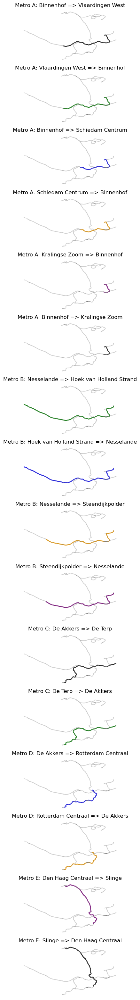

In [9]:
sub_order_route_dict, sub_shortest_path_pairs, sub_shortest_path_edges, sub_edges = metro(sub_stations, edges, nodes, sub_routes, city='Amsterdam')

In [10]:
sub_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(sub_order_route_dict, sub_routes)

In [11]:
aggregation_functions = {
    'name': 'first',
    'geometry': 'first',
    'geo_x': 'first',
    'geo_y': 'first',
    'route_name_list': lambda x: ', '.join(x),
    'ref': (lambda x: ', '.join(x)),
    'route': 'first'
}

In [12]:
sub_new_nodes = add_columns_to_nodes(sub_order_route_dict, aggregation_functions, nodes)

In [13]:
sub_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(sub_shortest_path_edges, sub_routes)

In [14]:
aggregation_functions = {
    'geometry': 'first',
    'count_weight': 'first',
    'route_name_list': lambda x: ', '.join(x),
    'ref': lambda x: ', '.join(x),
    'route': 'first'
}

In [15]:
sub_new_edges = add_columns_to_edges(sub_shortest_path_edges, aggregation_functions, edges)

In [16]:
sub_path_s_e, sub_length_s_e, sub_short_path_edges_s_e, sub_start_end_points_coordinates_pairs, sub_start_end_nearest_id_pairs = transfer_shortest_path(s_e_coordinates, sub_new_edges, sub_new_nodes)

In [17]:
sub_short_path_edges

,osm_id,geometry,railway,service,id_x,from_id,to_id,distance,time,weights,to_from,from_to,id_y,count_weight,route_name_list,ref,route


In [18]:
sub_distance_s_s_tuple, sub_distance_e_e_tuple = walking_linear_distance(sub_start_end_points_coordinates_pairs,sub_start_end_nearest_id_pairs, sub_new_nodes)

In [19]:
sub_distance_s_s_tuple

48331.74885128405

In [20]:
sub_distance_e_e_tuple

52520.45155630073

In [21]:
choosesub_using_time_tuple = transfer_using_time(sub_short_path_edges_s_e, sub_distance_s_s_tuple, sub_distance_e_e_tuple)

In [22]:
choosesub_using_time_tuple

(20.170440081516958, 1210, 0.0, 20.170440081516958)

In [23]:
choosesub_using_time_tuple[1]

1210

# Tram

In [24]:
tram_stations, tram_edges, tram_nodes, tram_routes = prepare_tram(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 2741/2741 [00:00<00:00, 8592.17it/s]


In [25]:
tram_routes = tram_routes.loc[tram_routes.ref != 'EMA']

In [26]:
tram_routes, check_name = check_tram_routes(tram_stations, tram_routes)

In [27]:
replacement_dict = {
    ',': '',
    'Diemen': '',
    'Amsterdam': '',
    'Sloterdijk': 'Station Sloterdijk',
    'Osdorp Dijkgraafsplein': 'Dijkgraafplein',
    'Osdorp De Aker': 'Matterhorn'
}

tram_stations, tram_routes, check_name = recheck_tram_routes(replacement_dict, tram_stations, tram_routes)

In [28]:
replacement_dict = {
    'Amstelveen Westwijk': 'Westwijk'
}
tram_stations, tram_routes, check_name = recheck_tram_routes(replacement_dict, tram_stations, tram_routes)

In [29]:
tram_order_route_dict, tram_shortest_path_pairs, tram_shortest_path_edges, tram_edges_dict = tram(tram_stations, tram_edges, tram_nodes, tram_routes, city='Amsterdam')

AttributeError: 'int' object has no attribute 'name'

In [ ]:
tram_shortest_path_edges

In [ ]:
tram_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(tram_order_route_dict, tram_routes)

In [ ]:
aggregation_functions_nodes = {
    'name': 'first',
    'geometry': 'first',
    'geo_x': 'first',
    'geo_y': 'first',
    'route_name_list': lambda x: ', '.join(x),
    'ref': (lambda x: ', '.join(x)),
    'route': 'first'
}

In [ ]:
tram_new_nodes = add_columns_to_nodes(tram_order_route_dict, aggregation_functions_nodes, tram_nodes)

In [ ]:
tram_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(tram_shortest_path_edges, tram_routes)

In [ ]:
tram_shortest_path_edges

In [ ]:
aggregation_functions_edges = {
    'geometry': 'first',
    'count_weight': 'first',
    'route_name_list': lambda x: ', '.join(x),
    'ref': lambda x: ', '.join(x),
    'route': 'first'
}

In [ ]:
tram_edges

In [ ]:
tram_new_edges = add_columns_to_edges(tram_shortest_path_edges, aggregation_functions_edges, tram_edges)

In [ ]:
tram_new_edges

In [ ]:
tram_path_s_e, tram_length_s_e, tram_short_path_edges_s_e,tram_start_end_points_coordinates_pairs,tram_start_end_nearest_id_pairs = transfer_shortest_path(s_e_coordinates, tram_new_edges, tram_new_nodes)

In [ ]:
tram_distance_s_s_tuple, tram_distance_e_e_tuple = walking_linear_distance(tram_start_end_points_coordinates_pairs,tram_start_end_nearest_id_pairs,tram_new_nodes)

In [ ]:
tram_distance_s_s_tuple

In [ ]:
tram_distance_e_e_tuple

In [ ]:
chosentram_using_time_tuple = transfer_using_time( tram_short_path_edges_s_e,tram_distance_s_s_tuple, tram_distance_e_e_tuple)

In [48]:
chosentram_using_time_tuple

(0.2606768663240623, 16, 0.13543237628288057, 0.1252444900411817)

# Compare

In [67]:
dict_fastest = compare_using_time_stb(choosesub_using_time_tuple, sub_new_edges, sub_short_path_edges, chosentram_using_time_tuple, tram_new_edges, tram_short_path_edges,choosebus_using_time_tuple,bus_new_edges,bus_short_path_edges)

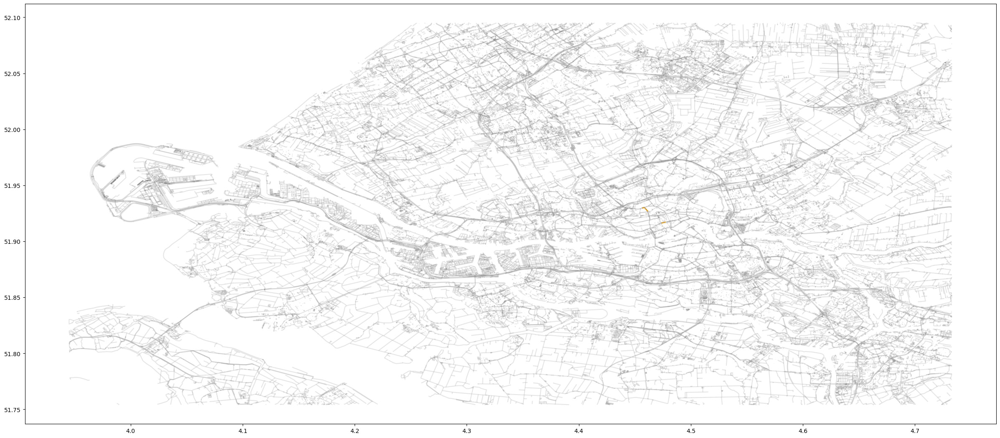

In [68]:
plot_chosen_route(dict_fastest)

In [ ]:
def compare_using_time(choosesub_using_time_tuple, sub_new_edges, sub_short_path_edges,
                       choosetram_using_time_tuple, tram_new_edges, tram_short_path_edges,
                       choosebus_using_time_tuple, bus_new_edges, bus_short_path_edges):
    
    using_time_subway = choosesub_using_time_tuple[1]
    using_time_tram = choosetram_using_time_tuple[1]
    using_time_bus = choosebus_using_time_tuple[1]
    
    min_using_time = min(using_time_subway, using_time_tram, using_time_bus)

    if min_using_time == using_time_subway:
        dict_fastest = {'using_time': using_time_subway,
                 'new_edges': sub_new_edges,
                 'shortest_path_edges': sub_short_path_edges
                }
    elif min_using_time == using_time_tram:
        dict_fastest = {'using_time': using_time_tram,
                 'new_edges': tram_new_edges,
                 'shortest_path_edges': tram_short_path_edges
                }
    else:
        dict_fastest = {'using_time': using_time_bus,
                 'new_edges': bus_new_edges,
                 'shortest_path_edges': bus_short_path_edges
                }

    return dict_fastest

In [ ]:
def plot_chosen_route(dict_fastest):

    fig, ax = plt.subplots(1, 1, figsize=(30, 20))

    gpd.GeoDataFrame(dict_fastest['new_edges'].copy()).plot(ax=ax, color='gray', alpha=0.2)
    gpd.GeoDataFrame(dict_fastest['short_path_edges'].copy()).plot(ax=ax, zorder=1, linewidth=(dict_fastest['short_path_edges'].count_weight) * 2, color='orange')